In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,classification_report,roc_auc_score,confusion_matrix,roc_curve,auc
from sklearn import preprocessing
from warnings import filterwarnings
import os
import cv2

# IGNORING UNNECESSARRY WARNINGS

filterwarnings("ignore",category=DeprecationWarning)
filterwarnings("ignore", category=FutureWarning)
filterwarnings("ignore", category=UserWarning)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Import and Shuffle the dataset

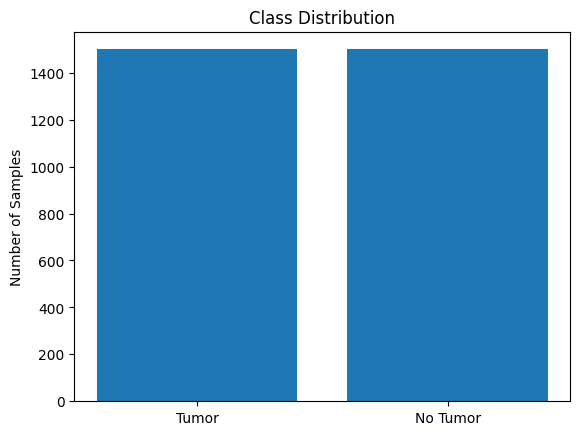

In [ ]:
path = os.listdir('/content/drive/My Drive/brain_tumor_dataset')
classes = {'no':0, 'yes':1}

import random

# data set
data_x = []
data_y = []

# We will use this dataset for visualizing in test prediction
test_x = []
test_y = []

data = []

for cls in classes:
    pth = '/content/drive/My Drive/brain_tumor_dataset/' + cls
    for j in os.listdir(pth):
        img = cv2.imread(pth + '/' + j, 0)
        img = cv2.resize(img, (200, 200))
        data.append((img, classes[cls]))

# Shuffle the data for the current class
random.shuffle(data)

# Define the class names
class_names = ['Tumor', 'No Tumor']

# Count the number of samples in each class
class_counts = {}
for _, cls in data:
    if cls in class_counts:
        class_counts[cls] += 1
    else:
        class_counts[cls] = 1

# Plot the bar chart
plt.bar(class_names, class_counts.values())
plt.ylabel('Number of Samples')
plt.title('Class Distribution')
plt.show()

In [ ]:
# Split the data into train and test sets
images, labels = zip(*data)
data_images, test_images, data_labels, test_labels = train_test_split(images, labels, test_size=0.01, random_state=42)

# Append the shuffled data,test to the main lists
data_x.extend(data_images)
data_y.extend(data_labels)

test_x.extend(test_images)
test_y.extend(test_labels)
print(test_y)


print('Data set size : ',len(data_x))
print('Test set size : ',len(test_x))

[1, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0]
Data set size :  2970
Test set size :  30


# Preparing the data

In [ ]:
data_x = np.array(data_x)
data_y = np.array(data_y)

data_x_updated = data_x.reshape(len(data_x), -1)
data_x_updated.shape

xtrain, xtest, ytrain, ytest = train_test_split(data_x_updated, data_y, random_state=10,
                                               test_size=.20)
xtrain.shape, xtest.shape

((2376, 40000), (594, 40000))

## Feature Scaling

In [ ]:
# AS we can see, x_train & x_test are not scale
print(xtrain)
print(xtrain.max(), xtrain.min())
print(xtest.max(), xtest.min())

# Scaling the dataset
scaler = preprocessing.MinMaxScaler()
xtrain = scaler.fit_transform(xtrain)
xtest = scaler.fit_transform(xtest)

print(xtrain.max(), xtrain.min())
print(xtest.max(), xtest.min())
print(xtrain)

[[  0   0   0 ...  10   0   0]
 [ 12  14  13 ...  18  16 107]
 [ 10  10  10 ...  10  10  10]
 ...
 [ 84 106 108 ... 114 126  39]
 [ 12  13  14 ...  12  12  12]
 [ 13  11  21 ...   0   0   0]]
255 0
255 0
1.0 0.0
1.0000000000000002 0.0
[[0.         0.         0.         ... 0.03921569 0.         0.        ]
 [0.04705882 0.05490196 0.05098039 ... 0.07058824 0.0627451  0.41960784]
 [0.03921569 0.03921569 0.03921569 ... 0.03921569 0.03921569 0.03921569]
 ...
 [0.32941176 0.41568627 0.42352941 ... 0.44705882 0.49411765 0.15294118]
 [0.04705882 0.05098039 0.05490196 ... 0.04705882 0.04705882 0.04705882]
 [0.05098039 0.04313725 0.08235294 ... 0.         0.         0.        ]]


# Drawing metrics function

In [ ]:
def plot_metrics(ytest,pred):

    # Compute confusion matrix
    cm = confusion_matrix(ytest, pred)

    # Compute classification report
    report = classification_report(ytest, pred)
    #  report
    print('\n',report,'\n','_'*230,'\n\n')


    # Compute ROC curve
    fpr, tpr, thresholds = roc_curve(ytest, pred)
    roc_auc = auc(fpr, tpr)

    # Plot confusion matrix, classification report, and ROC curve
    plt.figure(figsize=(15, 5))

    # Plot confusion matrix
    plt.subplot(1, 2, 2)
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
    plt.title("Confusion Matrix", {'fontsize': 20},y=1.3)
    plt.xlabel("Predicted Labels")
    plt.ylabel("True Labels")

    # Plot ROC curve
    plt.subplot(1, 2, 1)
    plt.plot(fpr, tpr, color='b', label='ROC curve (AUC = {:.2f})'.format(roc_auc))
    plt.plot([0, 1], [0, 1], color='r', linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC)', {'fontsize': 20},y=1.3)
    plt.legend(loc="lower right")

    plt.tight_layout()
    plt.show()

# **Logisitic Regression Classifier**

## Training the Model

In [ ]:
from sklearn.linear_model import LogisticRegression

import warnings
warnings.filterwarnings('ignore')

# Training the dataset
lg = LogisticRegression(C=0.1)
lg.fit(xtrain, ytrain)

# Evaluation
print("Training Score:", lg.score(xtrain, ytrain))
print("Testing Score:", lg.score(xtest, ytest))

# Prediction
pred = lg.predict(xtest)

Training Score: 1.0
Testing Score: 0.9713804713804713


## Generating Confusion matrix, Classification Report, and ROC Curves


               precision    recall  f1-score   support

           0       0.98      0.97      0.97       307
           1       0.97      0.98      0.97       287

    accuracy                           0.97       594
   macro avg       0.97      0.97      0.97       594
weighted avg       0.97      0.97      0.97       594
 
 ______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 




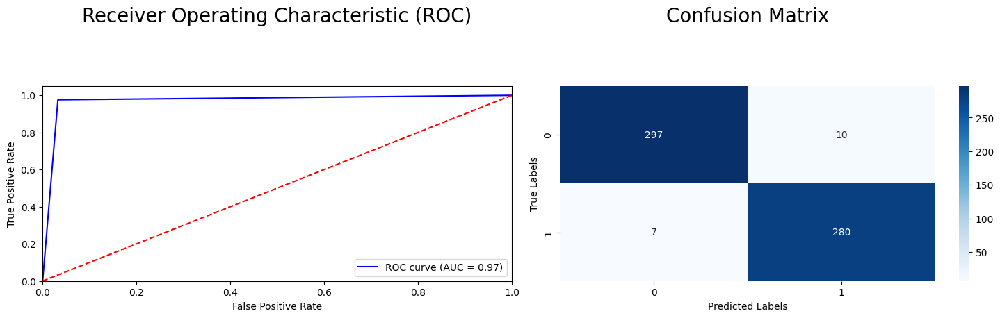

In [ ]:
plot_metrics(ytest,pred)

## Visualising the Result

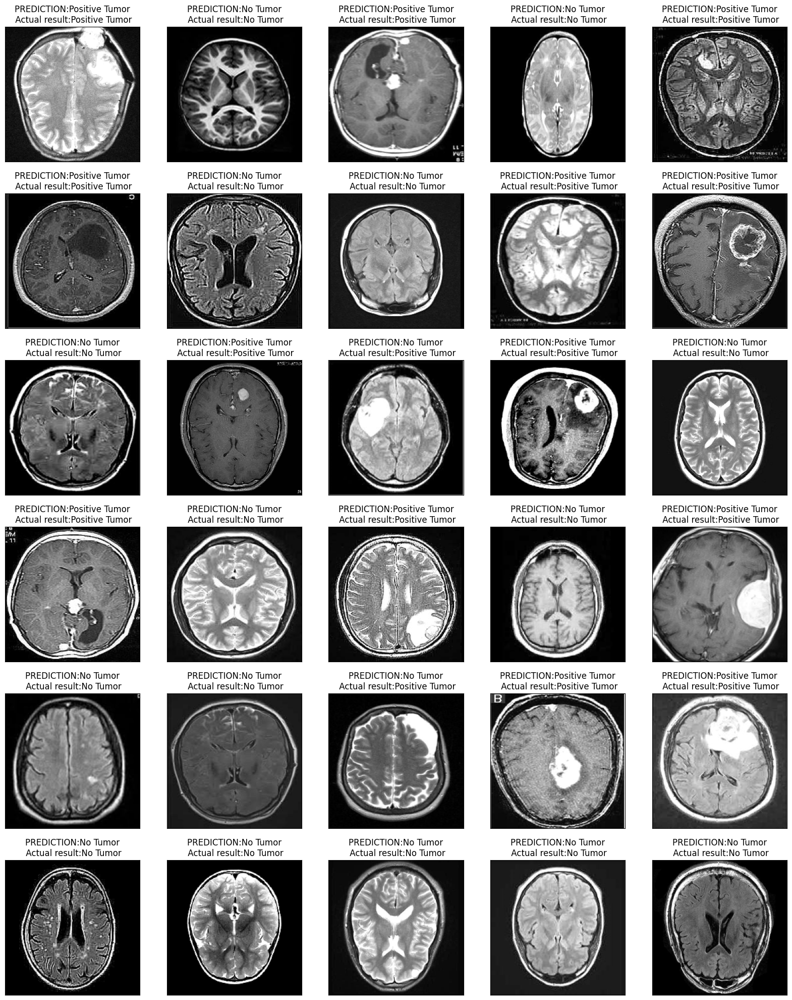

In [ ]:
dec = {0:'No Tumor', 1:'Positive Tumor'}

fig, axes = plt.subplots(nrows=6,
                         ncols=5,
                         figsize=(20, 25),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
       img1 = test_x[i].reshape(1,-1)/255
       p = lg.predict(img1)
       ax.imshow(test_x[i],cmap='gray')
       ax.set_title(f"PREDICTION:{dec[p[0]]}\n Actual result:{dec[test_y[i]]}")



# **SVC Model**

## Training the Model

In [ ]:
from sklearn.svm import SVC

# Training the dataset
sv = SVC()
sv.fit(xtrain, ytrain)

# Evaluation
print("Training Score:", sv.score(xtrain, ytrain))
print("Testing Score:", sv.score(xtest, ytest))

# Prediction
pred = sv.predict(xtest)

Training Score: 0.9806397306397306
Testing Score: 0.9427609427609428


## Generating Confusion matrix, Classification Report, and ROC Curves


               precision    recall  f1-score   support

           0       0.98      0.91      0.94       307
           1       0.91      0.98      0.94       287

    accuracy                           0.94       594
   macro avg       0.94      0.94      0.94       594
weighted avg       0.94      0.94      0.94       594
 
 ______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 




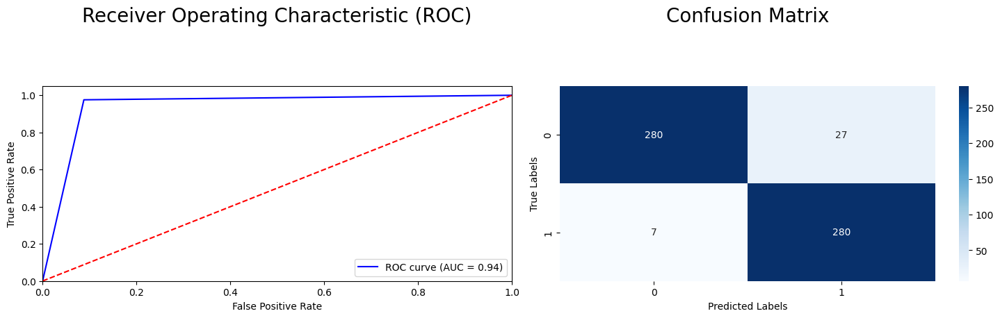

In [ ]:
plot_metrics(ytest,pred)

## Visualising the Result

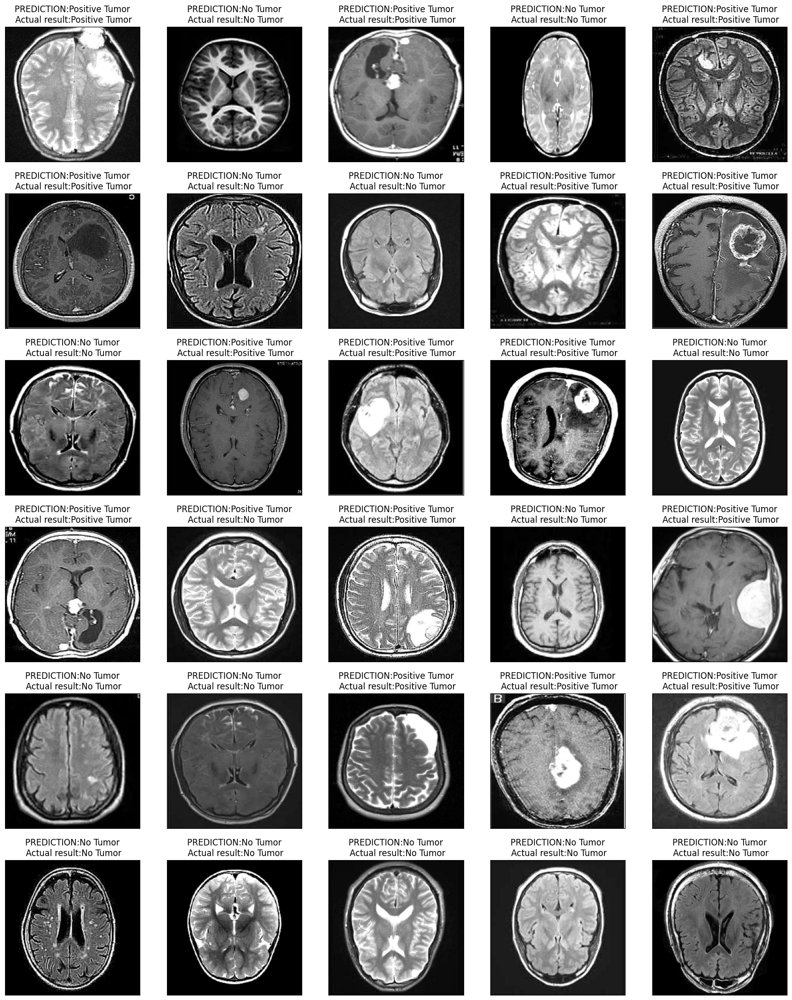

In [ ]:
dec = {0:'No Tumor', 1:'Positive Tumor'}

fig, axes = plt.subplots(nrows=6,
                         ncols=5,
                         figsize=(20, 25),
                        subplot_kw={'xticks': [], 'yticks': []})
for i, ax in enumerate(axes.flat):
       img1 = test_x[i].reshape(1,-1)/255
       p = sv.predict(img1)
       ax.imshow(test_x[i],cmap='gray')
       ax.set_title(f"PREDICTION:{dec[p[0]]}\n Actual result:{dec[test_y[i]]}")


# **kNN Classifier**

## Training the Model

In [ ]:
from sklearn.neighbors import KNeighborsClassifier

# train the dataset
knn_model = KNeighborsClassifier(n_neighbors=3)
knn_model.fit(xtrain, ytrain)

# Evaluation
print("Training Score:", knn_model.score(xtrain, ytrain))
print("Testing Score:", knn_model.score(xtest, ytest))

# Prediction
pred = knn_model.predict(xtest)

Training Score: 0.9755892255892256
Testing Score: 0.9225589225589226


## Generating Confusion matrix, Classification Report, and ROC Curves


               precision    recall  f1-score   support

           0       0.89      0.97      0.93       307
           1       0.97      0.87      0.92       287

    accuracy                           0.92       594
   macro avg       0.93      0.92      0.92       594
weighted avg       0.93      0.92      0.92       594
 
 ______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 




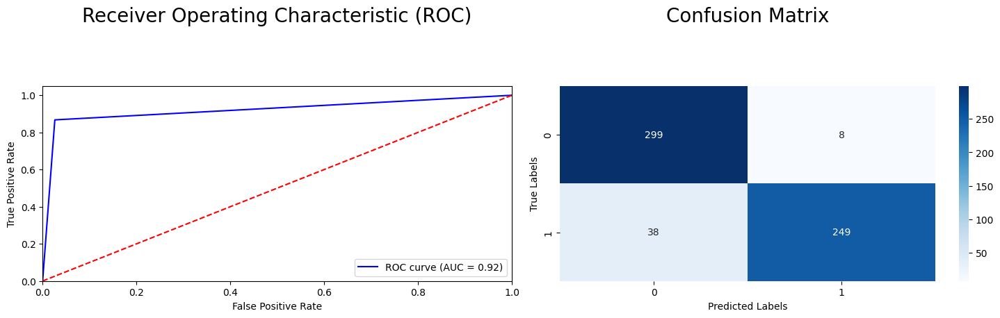

In [ ]:
plot_metrics(ytest, pred)

## Visualising the Result

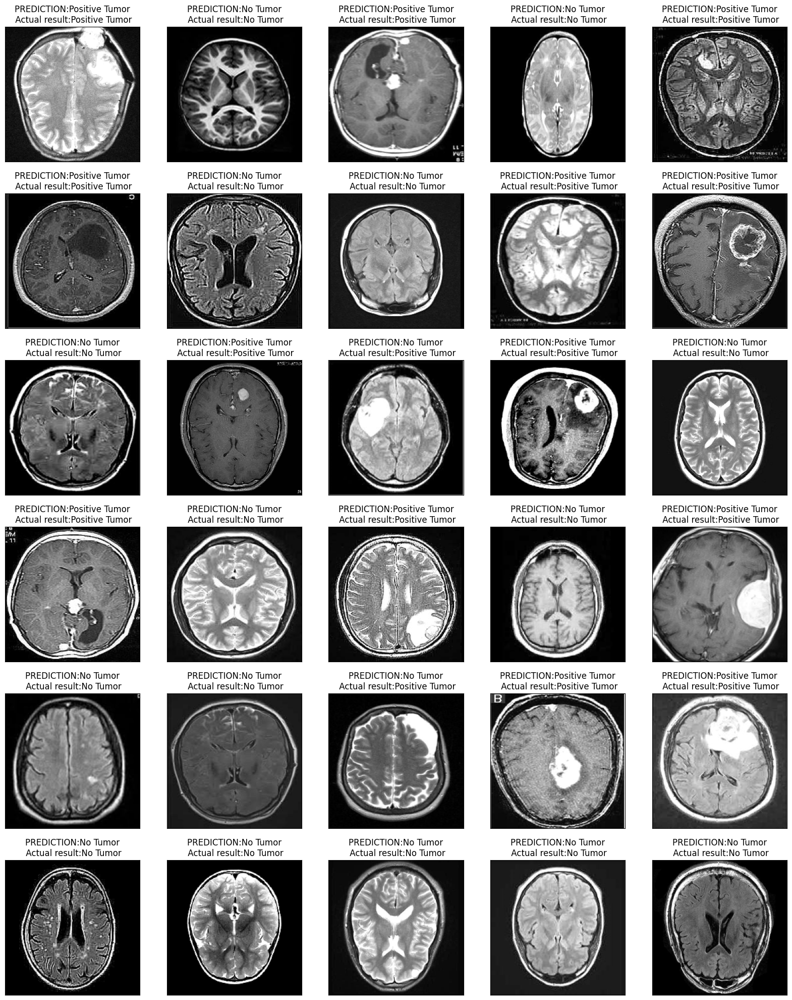

In [ ]:
dec = {0:'No Tumor', 1:'Positive Tumor'}

fig, axes = plt.subplots(nrows=6,
                         ncols=5,
                         figsize=(20, 25),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
       img1 = test_x[i].reshape(1,-1)/255
       p = knn_model.predict(img1)
       ax.imshow(test_x[i],cmap='gray')
       ax.set_title(f"PREDICTION:{dec[p[0]]}\n Actual result:{dec[test_y[i]]}")

# **Naive Bayes Classifier**

## Training the Model

In [ ]:
from sklearn.naive_bayes import GaussianNB

# train the dataset
nb_model = GaussianNB()
nb_model = nb_model.fit(xtrain, ytrain)

# Evaluation
print("Training Score:", nb_model.score(xtrain, ytrain))
print("Testing Score:", nb_model.score(xtest, ytest))

# Prediction
pred = nb_model.predict(xtest)

Training Score: 0.6982323232323232
Testing Score: 0.7037037037037037


## Generating Confusion matrix, Classification Report, and ROC Curves


               precision    recall  f1-score   support

           0       0.69      0.78      0.73       307
           1       0.72      0.62      0.67       287

    accuracy                           0.70       594
   macro avg       0.71      0.70      0.70       594
weighted avg       0.71      0.70      0.70       594
 
 ______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 




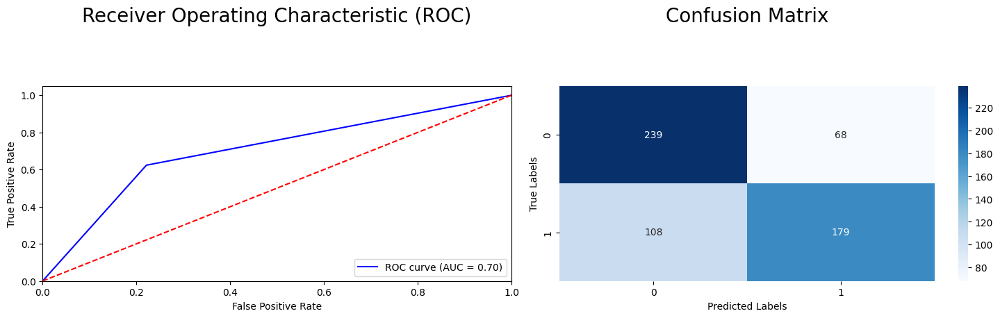

In [ ]:
plot_metrics(ytest,pred)

## Visualising the Result

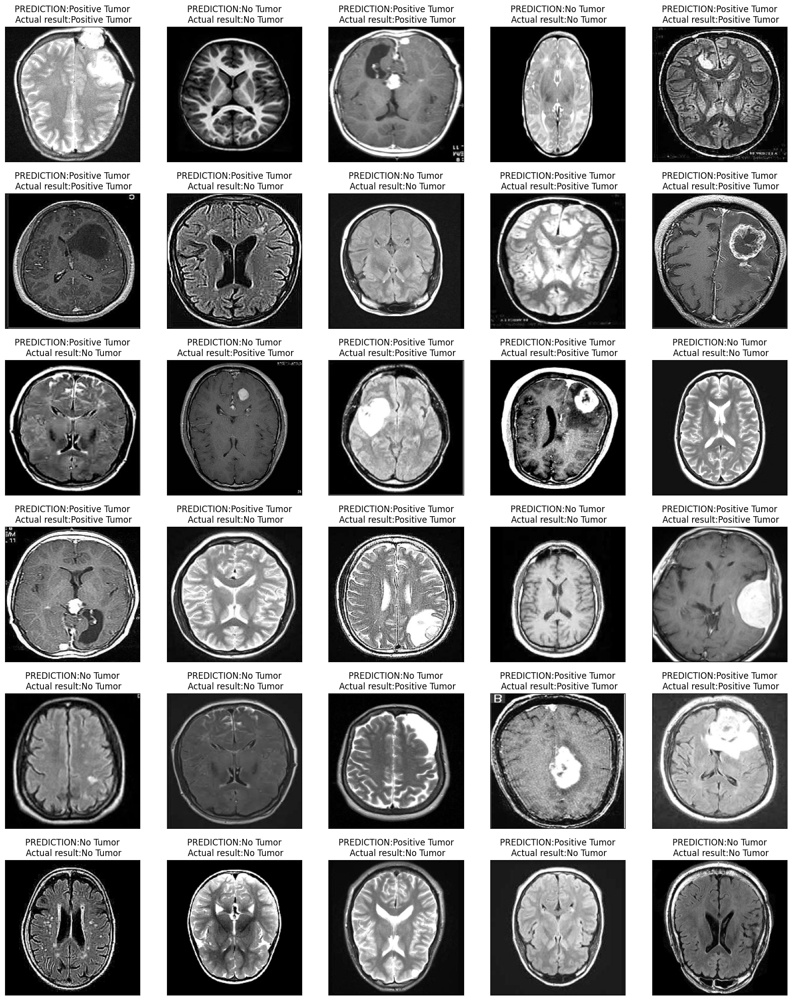

In [ ]:
dec = {0:'No Tumor', 1:'Positive Tumor'}

fig, axes = plt.subplots(nrows=6,
                         ncols=5,
                         figsize=(20, 25),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
       img1 = test_x[i].reshape(1,-1)/255
       p = nb_model.predict(img1)
       ax.imshow(test_x[i],cmap='gray')
       ax.set_title(f"PREDICTION:{dec[p[0]]}\n Actual result:{dec[test_y[i]]}")

# **Random Forest Classifier**

## Training the Model

In [ ]:
from sklearn.ensemble import RandomForestClassifier

# Train the Dataset
rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(xtrain, ytrain)

# Evaluation
print("Training Score:", rf.score(xtrain, ytrain))
print("Testing Score:", rf.score(xtest, ytest))

# Prediction
y_pred = rf.predict(xtest)

Training Score: 1.0
Testing Score: 0.9511784511784511


## Generating Confusion matrix, Classification Report, and ROC Curves


               precision    recall  f1-score   support

           0       0.97      0.93      0.95       307
           1       0.93      0.97      0.95       287

    accuracy                           0.95       594
   macro avg       0.95      0.95      0.95       594
weighted avg       0.95      0.95      0.95       594
 
 ______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 




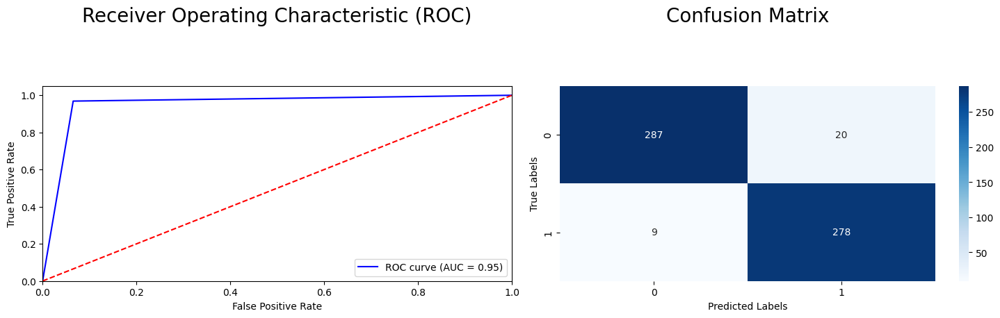

In [ ]:
plot_metrics(ytest,y_pred)

## Visualising the Result

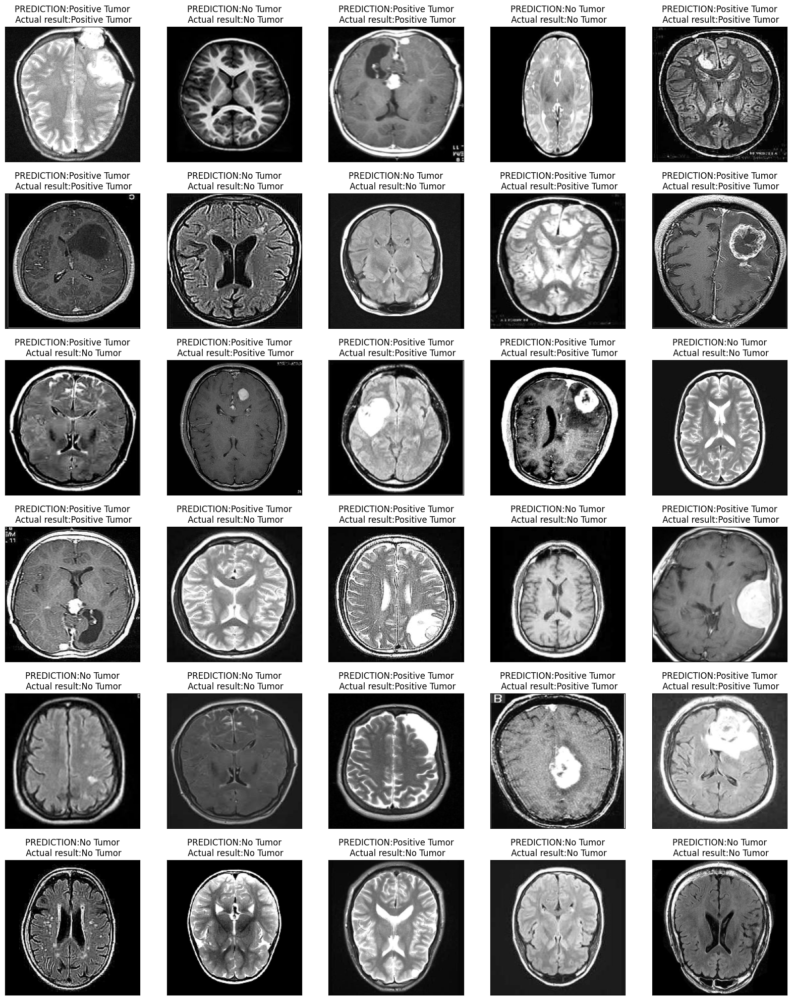

In [ ]:
dec = {0:'No Tumor', 1:'Positive Tumor'}

fig, axes = plt.subplots(nrows=6,
                         ncols=5,
                         figsize=(20, 25),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
       img1 = test_x[i].reshape(1,-1)/255
       p = rf.predict(img1)
       ax.imshow(test_x[i],cmap='gray')
       ax.set_title(f"PREDICTION:{dec[p[0]]}\n Actual result:{dec[test_y[i]]}")


# **K-Means Clustering**

## Training the Model

In [ ]:
from sklearn.cluster import KMeans

# Scaling the dataset (but here we use all the dataset not only train)
scaler = preprocessing.MinMaxScaler()
data_x = scaler.fit_transform(data_x_updated)

k = 2  # Number of clusters (normal and tumor)
kmeans = KMeans(n_clusters=k, random_state=42)
kmeans.fit(data_x)

y_pred = kmeans.labels_

## Generating Confusion matrix, Classification Report, and ROC Curves


               precision    recall  f1-score   support

           0       0.30      0.24      0.27      1485
           1       0.36      0.43      0.39      1485

    accuracy                           0.34      2970
   macro avg       0.33      0.34      0.33      2970
weighted avg       0.33      0.34      0.33      2970
 
 ______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 




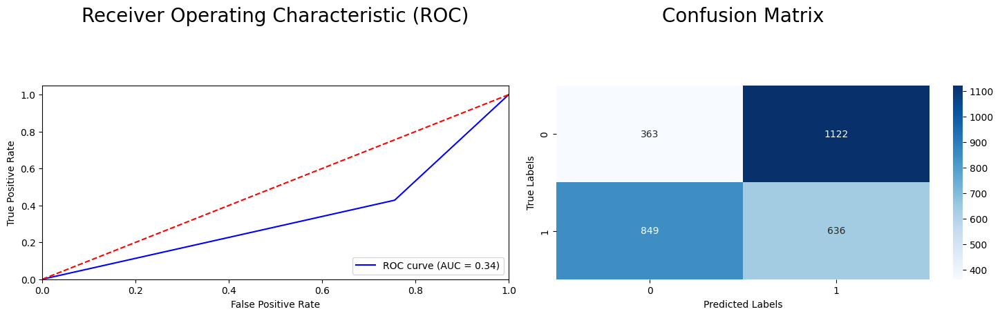

In [ ]:
plot_metrics(data_y,y_pred)

## Visualising the Result

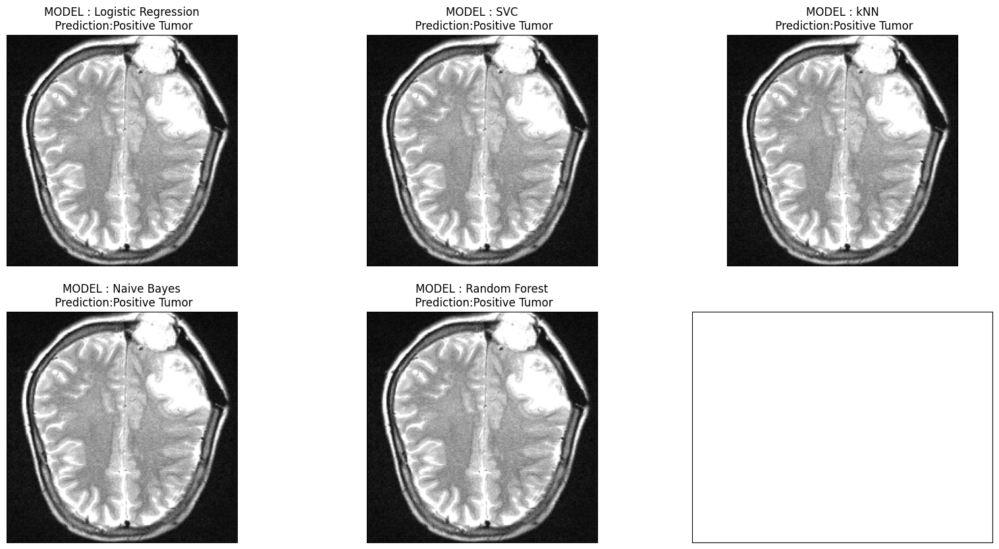

In [ ]:
dec = {0:'No Tumor', 1:'Positive Tumor'}
index = 0
img = test_x[index].reshape(1,-1)/255
p_lg = lg.predict(img)
p_sv = sv.predict(img)
p_knn = knn_model.predict(img)
p_nb = nb_model.predict(img)
p_rf = rf.predict(img)

models = ['Logistic Regression','SVC','kNN','Naive Bayes','Random Forest']
results = [p_lg,p_sv,p_knn,p_nb,p_rf]

fig, axes = plt.subplots(nrows=2,
                         ncols=3,
                         figsize=(20, 10),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    if i < len(models) and i < len(results):
        ax.imshow(test_x[index],cmap='gray')
        ax.set_title(f"MODEL : {models[i]}\n Prediction:{dec[results[i][0]]}")